# Feature Selection

## Environment

In [1]:
import pandas as pd
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt

import seaborn as sns


pd.set_option('display.max_columns', None)

pd.set_option('display.float_format', '{:.6g}'.format)

## Dataset

In [2]:
df_madrid_clean_cols = pd.read_csv("data/airbnb-clean-cols.csv")

In [3]:
df_madrid_clean_cols.head()

,Host Listings Count,Neighbourhood Group Cleansed,Latitude,Longitude,Property Type,Room Type,Accommodates,Bathrooms,Bedrooms,Beds,Price,Security Deposit,Cleaning Fee,Guests Included,Extra People,Minimum Nights,Availability 30,Availability 60,Availability 90,Availability 365,Number of Reviews,Review Scores Rating,Review Scores Accuracy,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Review Scores Value,Cancellation Policy,Calculated host listings count,Reviews per Month,Name_Len,Name_Lang,Summary_Len,Summary_Lang,Space_Len,Space_Lang,Description_Len,Description_Lang,is_Thumbnail,is_HostAbout,is_ResponseInHours,Num_Host_Verifications,is_EntireHome,is_Bed,is_UpdatedToday
0,1,Centro,40.4101,-3.71475,Apartment,PrivateRoom,2,1,1,1,36,NaN,NaN,1,0,2,1,1,1,1,80,98,10,10,10,10,10,10,flexible,1,2.33,34,True,67,True,488,True,1000,True,True,True,False,4,False,True,False
1,3,Centro,40.417,-3.70944,Apartment,EntireHome,2,1,1,1,85,100,30,1,0,3,12,32,45,320,90,95,10,9,10,10,10,10,strict,2,2.69,32,False,241,True,1000,True,1000,True,True,True,False,6,True,True,False
2,4,Centro,40.4097,-3.71356,Apartment,PrivateRoom,2,1,1,1,20,100,NaN,1,10,3,7,37,67,158,20,91,9,9,9,9,10,9,flexible,4,0.6,27,True,232,True,469,True,479,True,True,True,False,4,False,True,False
3,10,Centro,40.4232,-3.71125,Apartment,EntireHome,4,1,1,2,112,250,15,2,5,3,7,13,21,248,55,99,10,10,10,10,10,10,strict,9,3.56,35,False,249,False,1000,False,1000,False,True,True,True,6,True,True,True
4,1,Centro,40.4165,-3.71784,Apartment,EntireHome,8,3,3,4,190,200,20,6,40,3,6,20,24,296,46,96,10,10,10,10,10,9,moderate,1,1.13,33,False,271,True,939,True,1000,True,True,True,True,4,True,True,False


In [4]:
df_madrid_clean_cols.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13207 entries, 0 to 13206
Data columns (total 46 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Host Listings Count             13204 non-null  float64
 1   Neighbourhood Group Cleansed    13207 non-null  object 
 2   Latitude                        13207 non-null  float64
 3   Longitude                       13207 non-null  float64
 4   Property Type                   13207 non-null  object 
 5   Room Type                       13207 non-null  object 
 6   Accommodates                    13207 non-null  int64  
 7   Bathrooms                       13158 non-null  float64
 8   Bedrooms                        13184 non-null  float64
 9   Beds                            13158 non-null  float64
 10  Price                           13198 non-null  float64
 11  Security Deposit                5635 non-null   float64
 12  Cleaning Fee                    

In [5]:
df_madrid_clean_cols.describe().T

,count,mean,std,min,25%,50%,75%,max
Host Listings Count,13204,9.81377,27.5778,0,1,2,5,265
Latitude,13207,40.4205,0.0200324,40.3319,40.4101,40.4186,40.4278,40.5142
Longitude,13207,-3.69714,0.0233408,-3.8355,-3.70779,-3.70158,-3.69382,-3.57361
Accommodates,13207,3.19104,1.99133,1,2,2,4,16
Bathrooms,13158,1.25274,0.599699,0,1,1,1,8
Bedrooms,13184,1.29437,0.826831,0,1,1,2,10
Beds,13158,1.98602,1.51146,1,1,2,2,16
Price,13198,65.9247,56.0086,9,31,52,80,875
Security Deposit,5635,183.462,109.057,70,100,150,200,990
Cleaning Fee,7820,29.6293,25.939,4,15,25,35,500


## Numeric Features

### Correlation

In [6]:
num_cols = df_madrid_clean_cols._get_numeric_data().columns
corr = df_madrid_clean_cols[num_cols].corr()

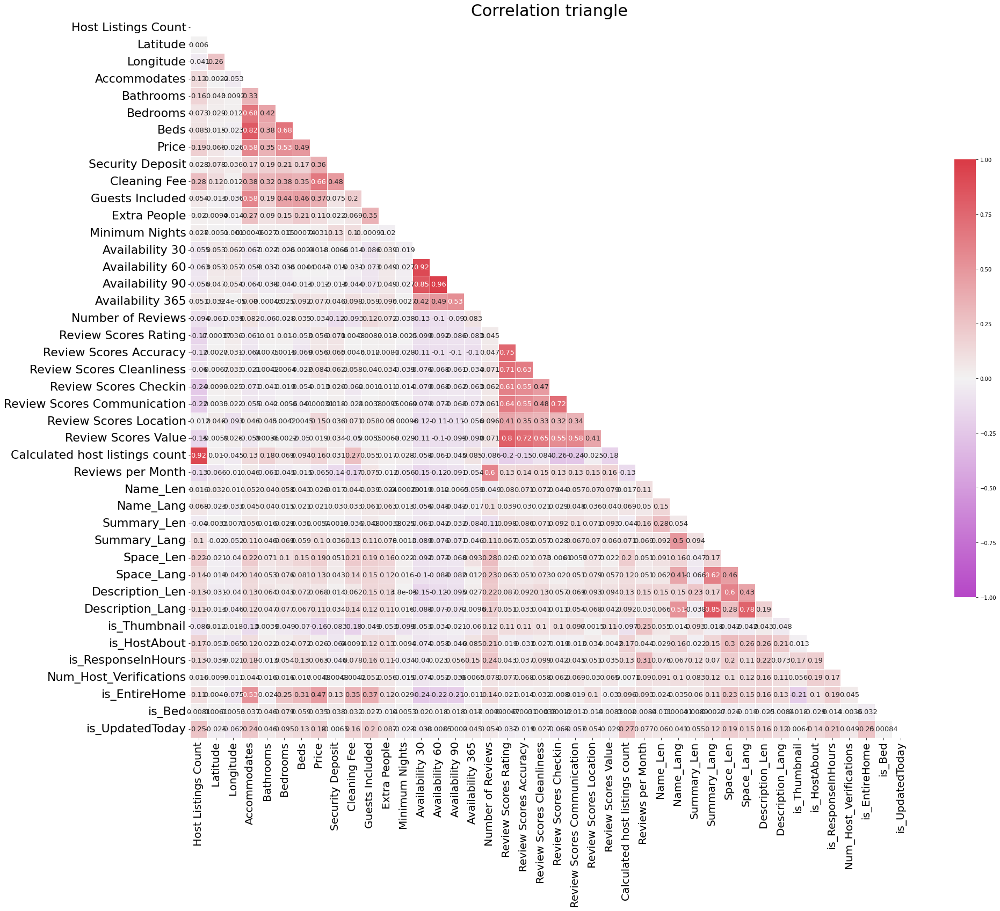

In [7]:
# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(30, 30))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(300, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, annot=True, vmin=-1, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot_kws={"size":13})
plt.title("Correlation triangle", fontsize='30')
plt.xticks(size=20)
plt.yticks(size=22)
plt.show()

In [8]:
def cond_formatting(x):
    if (x < -0.7) or (x > 0.7):
        return 'background-color: lightyellow'
    else:
        return None
      
corr.style.applymap(cond_formatting)

,Host Listings Count,Latitude,Longitude,Accommodates,Bathrooms,Bedrooms,Beds,Price,Security Deposit,Cleaning Fee,Guests Included,Extra People,Minimum Nights,Availability 30,Availability 60,Availability 90,Availability 365,Number of Reviews,Review Scores Rating,Review Scores Accuracy,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Review Scores Value,Calculated host listings count,Reviews per Month,Name_Len,Name_Lang,Summary_Len,Summary_Lang,Space_Len,Space_Lang,Description_Len,Description_Lang,is_Thumbnail,is_HostAbout,is_ResponseInHours,Num_Host_Verifications,is_EntireHome,is_Bed,is_UpdatedToday
Host Listings Count,1.000000,0.006023,-0.040793,0.126889,0.158946,0.073240,0.084766,0.188948,0.027685,0.281465,0.054436,0.019556,0.026662,-0.055238,-0.063457,-0.055977,0.051143,-0.093786,-0.171273,-0.119778,-0.059809,-0.237049,-0.215477,-0.012282,-0.152731,0.922969,-0.127751,0.016179,0.067502,-0.040356,0.102521,0.215930,0.138510,0.125472,0.111020,-0.086406,0.166723,0.129406,0.016172,0.114185,0.008100,0.253201
Latitude,0.006023,1.000000,0.257224,-0.002198,0.042839,0.029142,0.015374,0.065554,0.077787,0.118478,-0.013124,0.009357,-0.005066,0.052801,0.052647,0.046825,0.031629,-0.061346,-0.000368,0.002669,-0.006682,0.009877,0.003472,0.045909,-0.005901,0.010024,-0.065714,0.032360,-0.023435,0.003296,-0.019900,-0.021295,-0.019052,-0.031489,-0.013115,0.011837,-0.052963,-0.038938,-0.009935,0.004644,0.006109,-0.025266
Longitude,-0.040793,0.257224,1.000000,-0.052802,0.009218,0.012175,-0.023230,-0.025854,0.035686,0.012253,-0.035723,-0.014381,-0.001037,0.061761,0.056823,0.053876,0.000094,-0.039031,0.035894,0.030816,0.033453,0.025189,0.021648,-0.092914,0.026368,-0.045045,-0.010407,0.010261,-0.032649,-0.007299,-0.051628,-0.039767,-0.042482,-0.040447,-0.046279,0.017652,-0.064626,-0.021181,-0.010825,-0.074952,0.005295,-0.061820
Accommodates,0.126889,-0.002198,-0.052802,1.000000,0.332216,0.678169,0.824224,0.580916,0.170575,0.380299,0.582593,0.273281,0.000463,-0.066507,-0.059438,-0.064495,0.080252,0.082352,-0.061077,-0.063531,-0.020941,-0.070518,-0.055191,0.045579,-0.059304,0.128465,0.045518,0.052303,0.045250,0.056006,0.109525,0.218671,0.139169,0.131282,0.121088,-0.127552,0.115356,0.180394,0.044318,0.527396,0.036654,0.236175
Bathrooms,0.158946,0.042839,0.009218,0.332216,1.000000,0.423099,0.384998,0.349508,0.191646,0.324235,0.188703,0.090312,0.026821,-0.022312,-0.037260,-0.037673,-0.000431,-0.059989,0.010079,0.007501,0.004237,-0.040978,-0.042027,0.044577,0.003647,0.176080,-0.061056,0.040470,0.039627,0.016049,0.045764,0.070779,0.052594,0.064062,0.046703,0.003896,0.021725,-0.012982,0.016064,-0.023623,0.046285,0.045758
Bedrooms,0.073240,0.029142,0.012175,0.678169,0.423099,1.000000,0.684907,0.525673,0.208392,0.375778,0.435260,0.147740,0.014713,-0.025590,-0.035938,-0.044360,0.024731,-0.028489,0.010368,0.001539,0.006399,-0.018807,-0.005567,0.004215,-0.002215,0.068608,-0.044552,0.057566,0.015269,0.029482,0.068926,0.104773,0.076058,0.042715,0.076513,-0.049124,0.024311,0.054032,0.015626,0.249720,0.078518,0.095434
Beds,0.084766,0.015374,-0.023230,0.824224,0.384998,0.684907,1.000000,0.486250,0.169935,0.349128,0.459194,0.211927,0.000736,-0.002395,-0.004360,-0.012993,0.091607,0.035248,-0.052980,-0.068722,-0.021800,-0.054253,-0.040621,0.004546,-0.050036,0.093923,-0.015095,0.042613,0.020634,0.031004,0.059240,0.153192,0.081471,0.072220,0.067180,-0.070269,0.072157,0.125689,0.017148,0.314423,0.058923,0.130225
Price,0.188948,0.065554,-0.025854,0.580916,0.349508,0.525673,0.486250,1.000000,0.362665,0.657318,0.371806,0.110451,0.030708,0.018257,0.004681,-0.011550,0.077236,-0.033936,0.055743,0.056243,0.084334,-0.012520,-0.000315,0.146181,0.019117,0.159266,-0.064908,0.025607,0.020984,0.005393,0.103946,0.188889,0.128155,0.068267,0.111057,-0.162460,0.026487,0.062582,0.004837,0.465682,0.034818,0.184763
Security Deposit,0.027685,0.077787,0.035686,0.170575,0.191646,0.208392,0.169935,0.362665,1.000000,0.479677,0.074744,0.022020,0.129308

### Pairplot

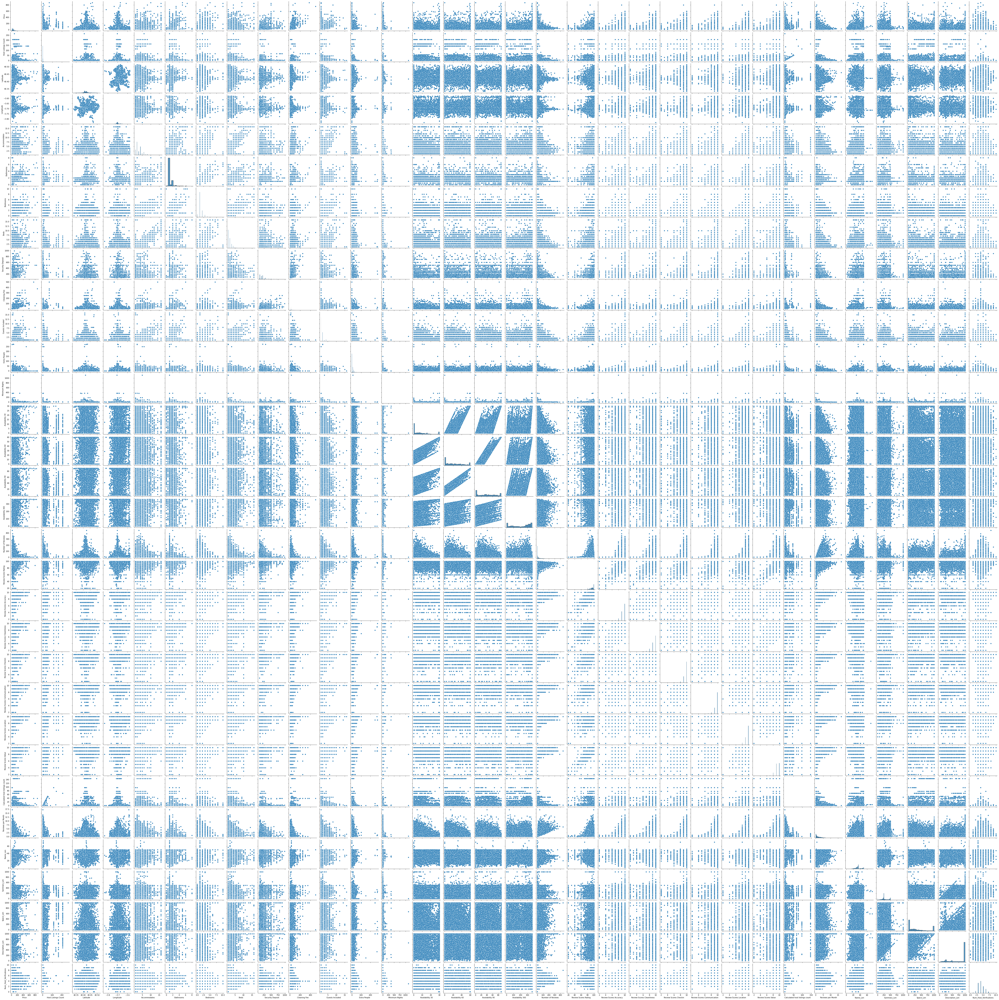

In [9]:
pairplot_cols = ['Price', 'Host Listings Count', 'Latitude', 'Longitude', 'Accommodates',
       'Bathrooms', 'Bedrooms', 'Beds', 'Security Deposit',
       'Cleaning Fee', 'Guests Included', 'Extra People', 'Minimum Nights',
       'Availability 30', 'Availability 60', 'Availability 90',
       'Availability 365', 'Number of Reviews', 'Review Scores Rating',
       'Review Scores Accuracy', 'Review Scores Cleanliness',
       'Review Scores Checkin', 'Review Scores Communication',
       'Review Scores Location', 'Review Scores Value',
       'Calculated host listings count', 'Reviews per Month', 'Name_Len',
       'Summary_Len', 'Space_Len','Description_Len', 'Num_Host_Verifications']
sns.pairplot(df_madrid_clean_cols[pairplot_cols])
plt.show()

**CORRELACIONES ALTAS**:

    - Calculated host listings count vs Host Listings Count: 0.92 - riesgo de colinearidad
    
    - Beds vs Accommodates: 0.82 - riesgo de colinearidad
    
    - Review Scores Rating, Review Scores Accuracy, Review Scores Cleanliness, Review Scores Checkin, Review Scores Communication, Review Scores Location, Review Scores Value  - riesgo de colinearidad
    
    - Name_Lag, Summary_Lang, Space_Lang, Description_Lang - riesgo de colinearidad
    
    - Availability 30, Availability 60, Availability 90, Availability 365 - riesgo de colinearidad
    
    

#### Calculated host listings count vs Host Listings Count

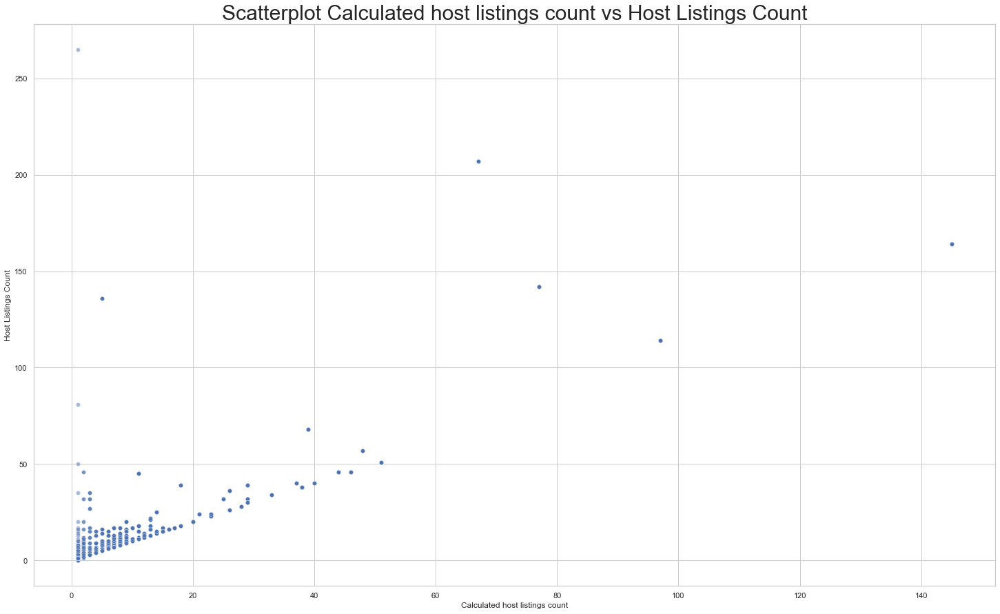

In [10]:
sns.set(rc={"figure.figsize":(25, 15)})
sns.set_style("whitegrid")

sns.scatterplot(data=df_madrid_clean_cols , x='Calculated host listings count', y='Host Listings Count', alpha=0.5)
plt.title('Scatterplot Calculated host listings count vs Host Listings Count', size=30)
plt.show()

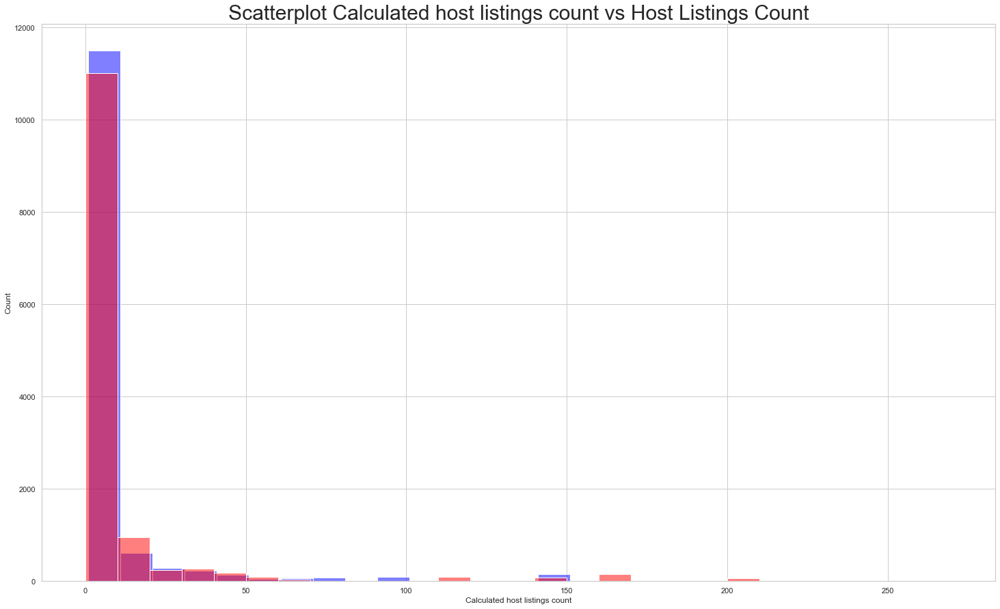

In [11]:
sns.histplot(data=df_madrid_clean_cols , x='Calculated host listings count', binwidth=10, color='blue', alpha=0.5)
sns.histplot(data=df_madrid_clean_cols , x='Host Listings Count', binwidth=10, color='red', alpha=0.5)
plt.title('Scatterplot Calculated host listings count vs Host Listings Count', size=30)
plt.show()

**Nos queedamos con 'Calculated host listings count'**

#### Beds vs Accommodates

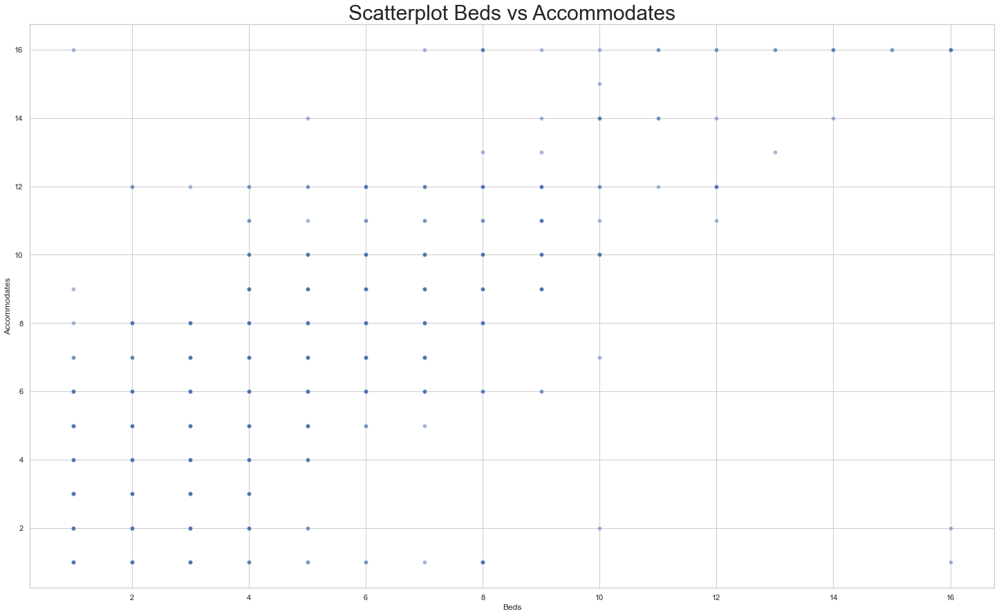

In [12]:
sns.scatterplot(data=df_madrid_clean_cols , x='Beds', y='Accommodates', alpha=0.5)
plt.title('Scatterplot Beds vs Accommodates', size=30)
plt.show()

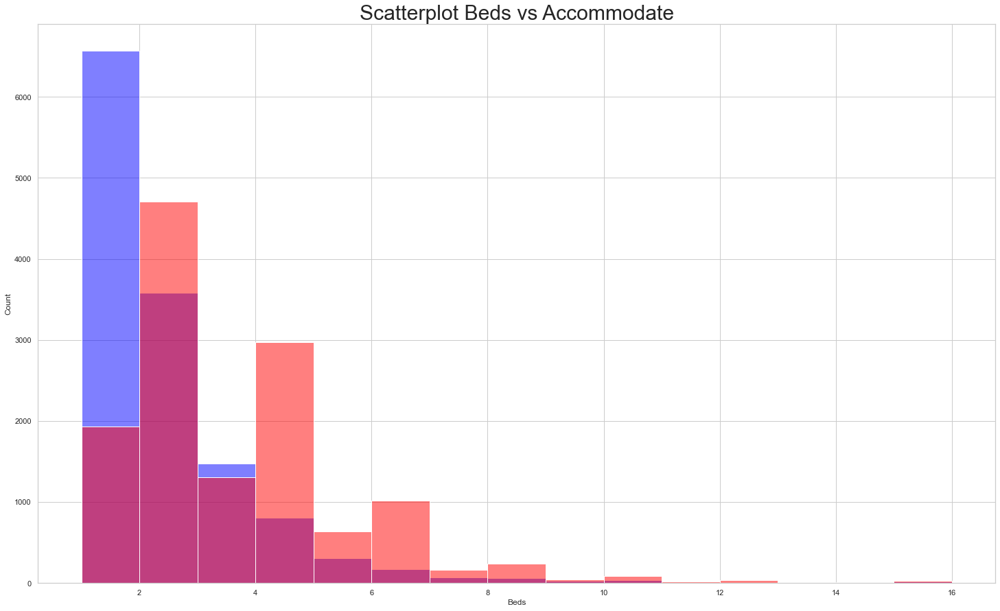

In [13]:
sns.histplot(data=df_madrid_clean_cols , x='Beds', binwidth=1, color='blue', alpha=0.5)
sns.histplot(data=df_madrid_clean_cols , x='Accommodates', binwidth=1, color='red', alpha=0.5)
plt.title('Scatterplot Beds vs Accommodate', size=30)
plt.show()

**Nos queedamos con las dos y más adelante vemos si quitamos alguna**

#### Reviews

In [14]:
df_reviews = df_madrid_clean_cols[['Review Scores Rating','Review Scores Accuracy',
                      'Review Scores Value','Review Scores Cleanliness', 'Review Scores Checkin', 
                      'Review Scores Communication', 'Review Scores Location', 'Price']]

In [15]:
df_reviews.corr()

,Review Scores Rating,Review Scores Accuracy,Review Scores Value,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Price
Review Scores Rating,1,0.753941,0.803446,0.707828,0.612461,0.640215,0.40635,0.0557426
Review Scores Accuracy,0.753941,1,0.72299,0.634485,0.54967,0.554335,0.346538,0.0562433
Review Scores Value,0.803446,0.72299,1,0.649977,0.553195,0.581573,0.413116,0.0191166
Review Scores Cleanliness,0.707828,0.634485,0.649977,1,0.472698,0.477401,0.330396,0.0843344
Review Scores Checkin,0.612461,0.54967,0.553195,0.472698,1,0.718659,0.315037,-0.0125195
Review Scores Communication,0.640215,0.554335,0.581573,0.477401,0.718659,1,0.336202,-0.000314523
Review Scores Location,0.40635,0.346538,0.413116,0.330396,0.315037,0.336202,1,0.146181
Price,0.0557426,0.0562433,0.0191166,0.0843344,-0.0125195,-0.000314523,0.146181,1


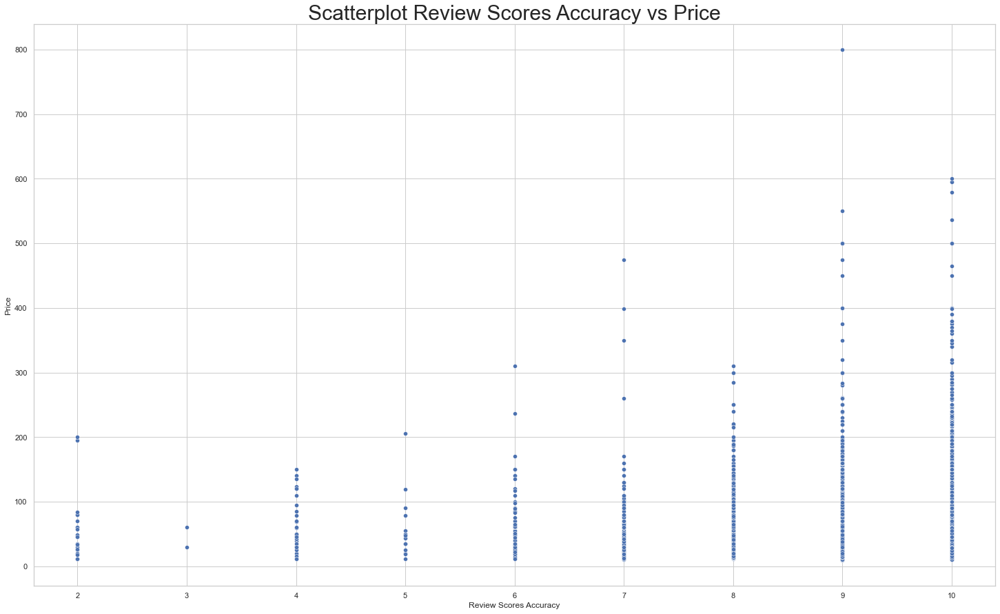

In [16]:
sns.scatterplot(data=df_madrid_clean_cols , x='Review Scores Accuracy', y='Price')
plt.title('Scatterplot Review Scores Accuracy vs Price', size=30)
plt.show()

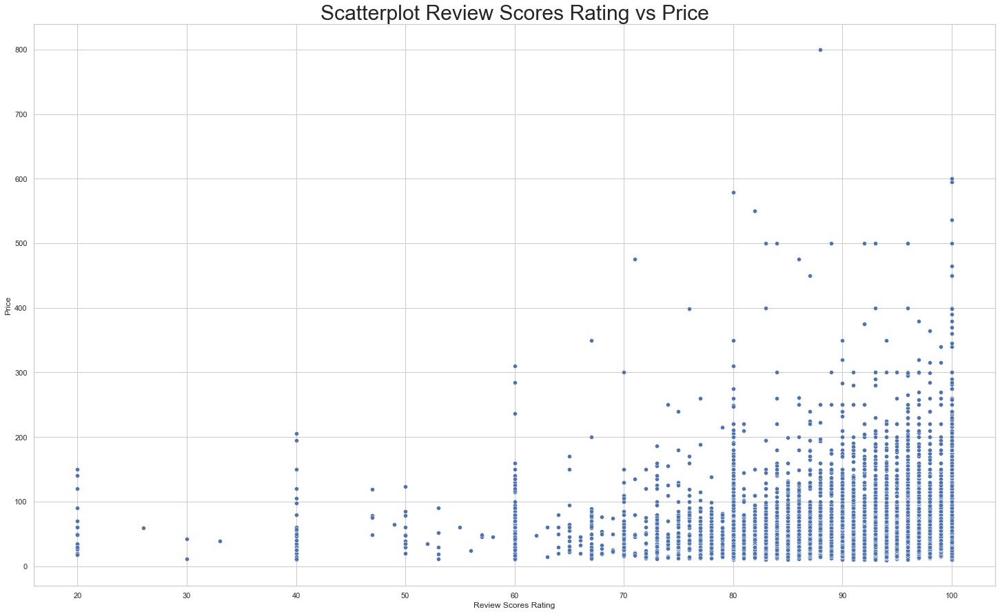

In [17]:
sns.scatterplot(data=df_madrid_clean_cols , x='Review Scores Rating', y='Price')
plt.title('Scatterplot Review Scores Rating vs Price', size=30)
plt.show()

**Nos queedamos con Review Scores Rating, Review Scores Cleanliness,	Review Scores Checkin,	Review Scores Communication y Review Scores Location**

#### Name_Lang, Summary_Lang, Space_Lang, Description_Lang

In [18]:
df_langs = df_madrid_clean_cols[['Latitude','Name_Lang','Summary_Lang','Space_Lang','Description_Lang']]

In [19]:
df_langs.head(10)

,Latitude,Name_Lang,Summary_Lang,Space_Lang,Description_Lang
0,40.4101,True,True,True,True
1,40.417,False,True,True,True
2,40.4097,True,True,True,True
3,40.4232,False,False,False,False
4,40.4165,False,True,True,True
5,40.4168,True,False,False,False
6,40.4139,True,False,False,False
7,40.4092,False,True,False,True
8,40.412,False,False,False,False
9,40.4099,False,True,True,True


In [20]:
df_langs.groupby(['Name_Lang','Summary_Lang','Space_Lang','Description_Lang']).count()

Latitude
Name_Lang Summary_Lang Space_Lang Description_Lang          
False     False        False      False                 5594
                                  True                    50
                       True       False                   70
                                  True                   401
          True         False      False                   82
                                  True                   467
                       True       False                    6
                                  True                  1336
True      False        False      False                  894
                                  True                    24
                       True       False                   32
                                  True                   399
          True         False      False                   81
                                  True                   904
                       True       False                    8
                                  True                  2859

**Nos quedamos el summary Lang que coicide el 75% de ocasiones con Space y Description Lang**

#### Availability 30, Availability 60, Availability 90, Availability 365

In [21]:
df_availability = df_madrid_clean_cols[['Availability 30','Availability 60', 
                                   'Availability 90', 'Availability 365', 'Price']]

In [22]:
df_availability.corr()

,Availability 30,Availability 60,Availability 90,Availability 365,Price
Availability 30,1,0.920724,0.851117,0.42304,0.0182572
Availability 60,0.920724,1,0.963951,0.487948,0.00468121
Availability 90,0.851117,0.963951,1,0.531512,-0.0115505
Availability 365,0.42304,0.487948,0.531512,1,0.0772358
Price,0.0182572,0.00468121,-0.0115505,0.0772358,1


**Nos quedamos con Availability 30 y 365**

## Categorical

In [23]:
df_madrid_clean_cols.select_dtypes(include='object').head()

,Neighbourhood Group Cleansed,Property Type,Room Type,Cancellation Policy
0,Centro,Apartment,PrivateRoom,flexible
1,Centro,Apartment,EntireHome,strict
2,Centro,Apartment,PrivateRoom,flexible
3,Centro,Apartment,EntireHome,strict
4,Centro,Apartment,EntireHome,moderate


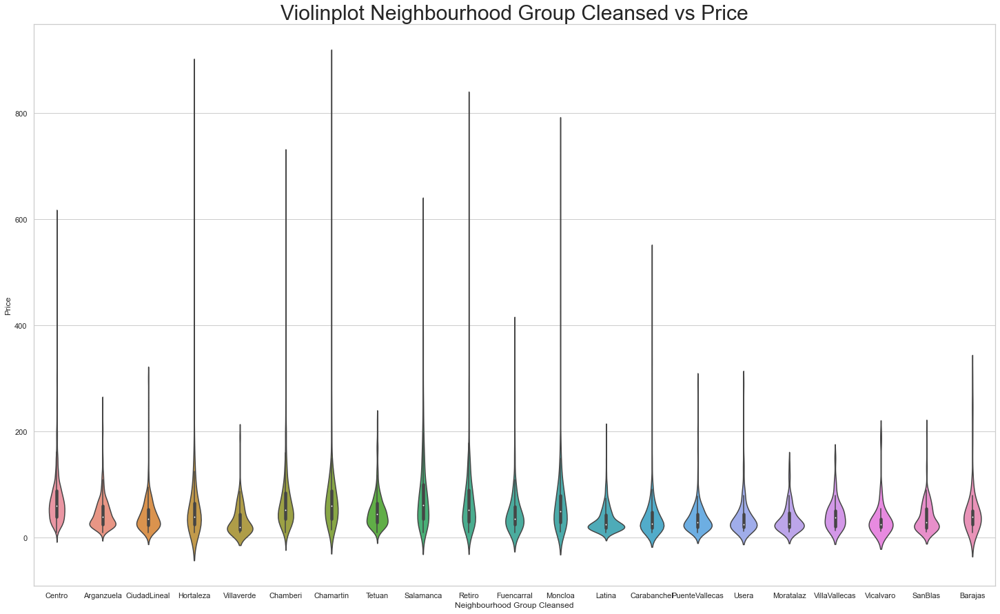

In [24]:
sns.violinplot(data=df_madrid_clean_cols, x='Neighbourhood Group Cleansed', y='Price')
plt.title('Violinplot Neighbourhood Group Cleansed vs Price', size=30)
plt.show()

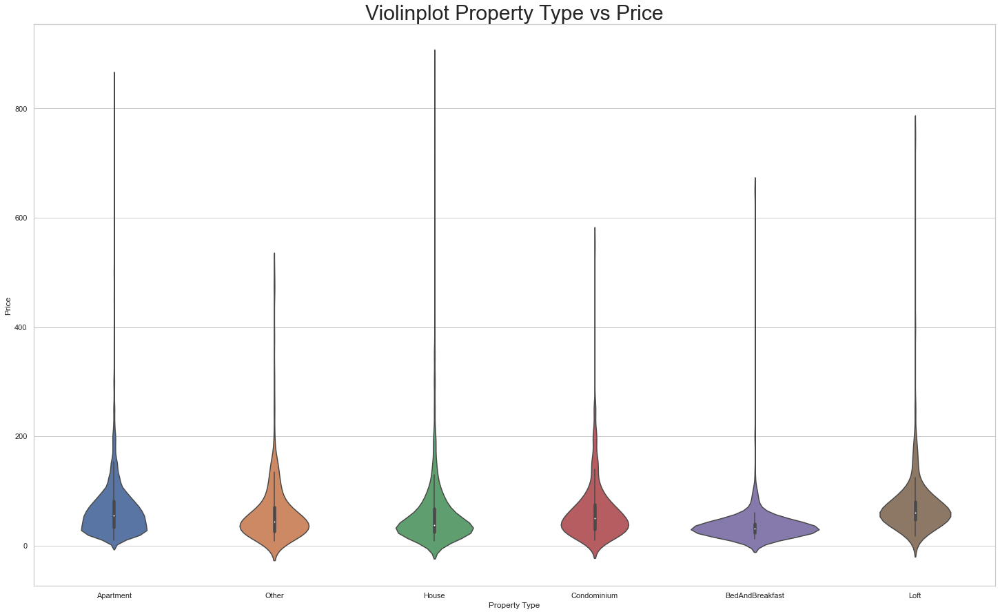

In [25]:
sns.violinplot(data=df_madrid_clean_cols, x='Property Type', y='Price')
plt.title('Violinplot Property Type vs Price', size=30)
plt.show()

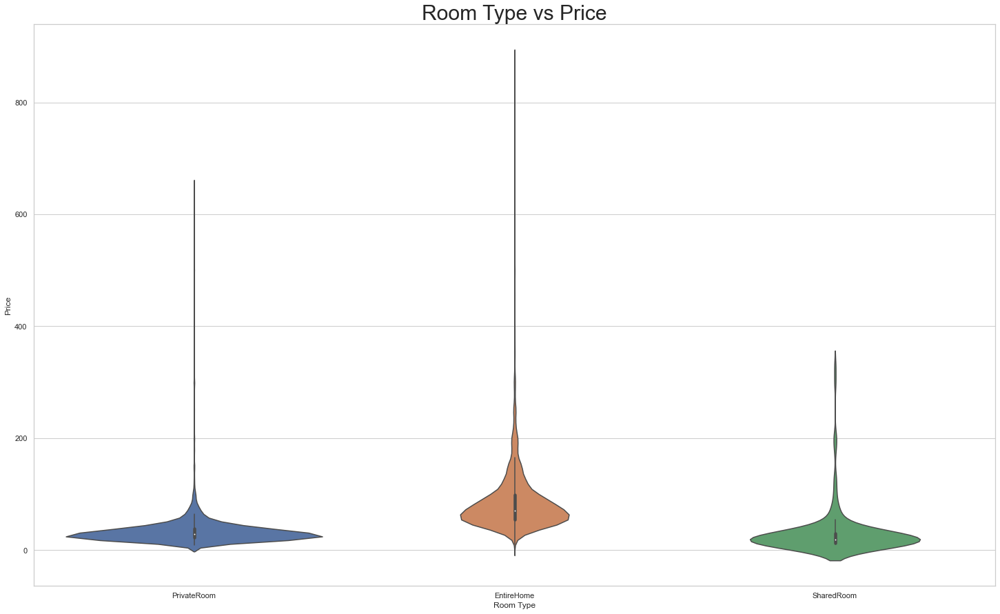

In [26]:
sns.violinplot(data=df_madrid_clean_cols, x='Room Type', y='Price')
plt.title('Room Type vs Price', size=30)
plt.show()

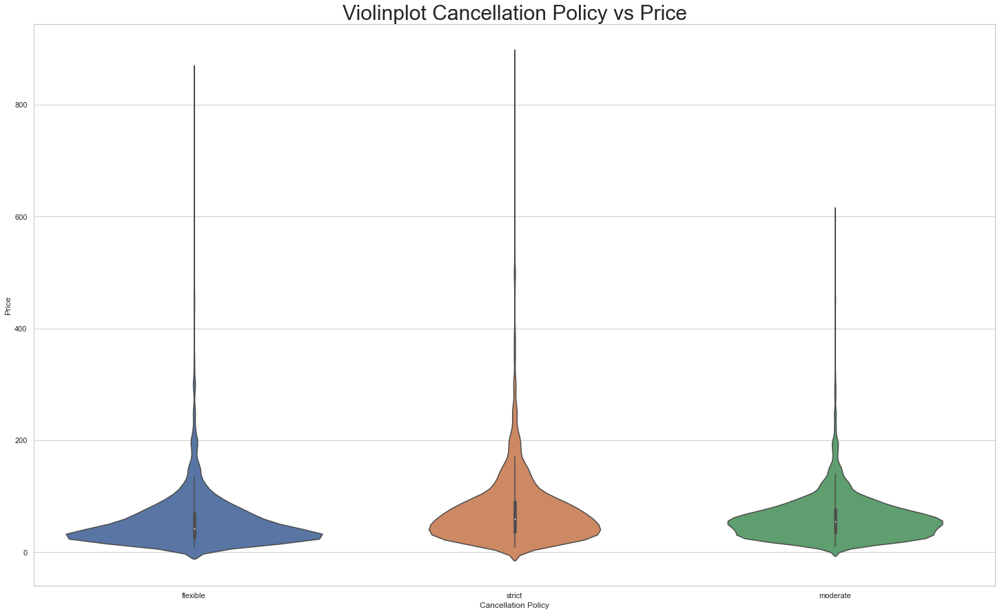

In [27]:
sns.violinplot(data=df_madrid_clean_cols, x='Cancellation Policy', y='Price')
plt.title('Violinplot Cancellation Policy vs Price', size=30)
plt.show()

## New Dataframe

In [28]:
list(df_madrid_clean_cols.columns)

['Host Listings Count',
 'Neighbourhood Group Cleansed',
 'Latitude',
 'Longitude',
 'Property Type',
 'Room Type',
 'Accommodates',
 'Bathrooms',
 'Bedrooms',
 'Beds',
 'Price',
 'Security Deposit',
 'Cleaning Fee',
 'Guests Included',
 'Extra People',
 'Minimum Nights',
 'Availability 30',
 'Availability 60',
 'Availability 90',
 'Availability 365',
 'Number of Reviews',
 'Review Scores Rating',
 'Review Scores Accuracy',
 'Review Scores Cleanliness',
 'Review Scores Checkin',
 'Review Scores Communication',
 'Review Scores Location',
 'Review Scores Value',
 'Cancellation Policy',
 'Calculated host listings count',
 'Reviews per Month',
 'Name_Len',
 'Name_Lang',
 'Summary_Len',
 'Summary_Lang',
 'Space_Len',
 'Space_Lang',
 'Description_Len',
 'Description_Lang',
 'is_Thumbnail',
 'is_HostAbout',
 'is_ResponseInHours',
 'Num_Host_Verifications',
 'is_EntireHome',
 'is_Bed',
 'is_UpdatedToday']

In [29]:
drop_columns = ['Host Listings Count', 'Review Scores Accuracy','Review Scores Value',
               'Name_Lang', 'Space_Lang', 'Description_Lang',  
                'Availability 60', 'Availability 90']

In [30]:
df_madrid_sel1_cols = df_madrid_clean_cols.drop(drop_columns, axis=1)

In [31]:
df_madrid_sel1_cols.head(10)

,Neighbourhood Group Cleansed,Latitude,Longitude,Property Type,Room Type,Accommodates,Bathrooms,Bedrooms,Beds,Price,Security Deposit,Cleaning Fee,Guests Included,Extra People,Minimum Nights,Availability 30,Availability 365,Number of Reviews,Review Scores Rating,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Cancellation Policy,Calculated host listings count,Reviews per Month,Name_Len,Summary_Len,Summary_Lang,Space_Len,Description_Len,is_Thumbnail,is_HostAbout,is_ResponseInHours,Num_Host_Verifications,is_EntireHome,is_Bed,is_UpdatedToday
0,Centro,40.4101,-3.71475,Apartment,PrivateRoom,2,1,1,1,36,NaN,NaN,1,0,2,1,1,80,98,10,10,10,10,flexible,1,2.33,34,67,True,488,1000,True,True,False,4,False,True,False
1,Centro,40.417,-3.70944,Apartment,EntireHome,2,1,1,1,85,100,30,1,0,3,12,320,90,95,9,10,10,10,strict,2,2.69,32,241,True,1000,1000,True,True,False,6,True,True,False
2,Centro,40.4097,-3.71356,Apartment,PrivateRoom,2,1,1,1,20,100,NaN,1,10,3,7,158,20,91,9,9,9,10,flexible,4,0.6,27,232,True,469,479,True,True,False,4,False,True,False
3,Centro,40.4232,-3.71125,Apartment,EntireHome,4,1,1,2,112,250,15,2,5,3,7,248,55,99,10,10,10,10,strict,9,3.56,35,249,False,1000,1000,True,True,True,6,True,True,True
4,Centro,40.4165,-3.71784,Apartment,EntireHome,8,3,3,4,190,200,20,6,40,3,6,296,46,96,10,10,10,10,moderate,1,1.13,33,271,True,939,1000,True,True,True,4,True,True,False
5,Centro,40.4168,-3.71024,Apartment,PrivateRoom,2,2,1,1,30,NaN,15,1,5,10,6,341,3,67,5,10,10,10,strict,97,0.14,24,370,False,187,923,True,True,True,4,False,True,False
6,Centro,40.4139,-3.70564,Apartment,PrivateRoom,1,1,1,1,18,NaN,15,1,0,10,0,281,0,NaN,NaN,NaN,NaN,NaN,strict,97,NaN,24,341,False,129,991,True,True,True,4,False,True,False
7,Centro,40.4092,-3.70405,Apartment,PrivateRoom,2,1,1,1,38,70,12,1,10,2,12,347,78,93,10,9,10,9,moderate,3,2.2,29,148,True,0,1000,True,True,True,5,False,True,False
8,Centro,40.412,-3.70669,Apartment,EntireHome,2,1,1,1,71,350,20,1,0,14,1,174,8,90,10,10,10,10,flexible,6,0.72,32,237,False,0,237,True,False,True,5,True,True,False
9,Centro,40.4099,-3.69552,Apartment,EntireHome,2,1,0,1,48,NaN,NaN,1,0,3,4,321,49,90,9,10,10,10,moderate,1,2.72,34,248,True,145,899,True,False,True,3,True,False,False


In [32]:
df_madrid_sel1_cols.shape

(13207, 38)

In [33]:
df_madrid_sel1_cols  = df_madrid_sel1_cols[[
 'Neighbourhood Group Cleansed', 
  'Property Type',
 'Room Type',
 'Cancellation Policy',    
 'Latitude',
 'Longitude',
 'Accommodates',
 'Bathrooms',
 'Bedrooms',
 'Beds',
 'Guests Included',
 'Extra People',
 'Minimum Nights',
 'Availability 30',
 'Availability 365',
 'Number of Reviews',
 'Review Scores Rating',
 'Review Scores Cleanliness',
 'Review Scores Checkin',
 'Review Scores Communication',
 'Review Scores Location',
 'Reviews per Month',
 'Security Deposit',
 'Cleaning Fee',
 'Calculated host listings count',
  'Num_Host_Verifications',    
 'Name_Len',
 'Summary_Len',
 'Space_Len',
 'Description_Len',
  'Summary_Lang',
 'is_Thumbnail',
 'is_HostAbout',
 'is_ResponseInHours',
 'is_EntireHome',
 'is_Bed',
 'is_UpdatedToday','Price']]

In [34]:
df_madrid_sel1_cols.shape

(13207, 38)

In [35]:
df_madrid_sel1_cols.head(10)

,Neighbourhood Group Cleansed,Property Type,Room Type,Cancellation Policy,Latitude,Longitude,Accommodates,Bathrooms,Bedrooms,Beds,Guests Included,Extra People,Minimum Nights,Availability 30,Availability 365,Number of Reviews,Review Scores Rating,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Reviews per Month,Security Deposit,Cleaning Fee,Calculated host listings count,Num_Host_Verifications,Name_Len,Summary_Len,Space_Len,Description_Len,Summary_Lang,is_Thumbnail,is_HostAbout,is_ResponseInHours,is_EntireHome,is_Bed,is_UpdatedToday,Price
0,Centro,Apartment,PrivateRoom,flexible,40.4101,-3.71475,2,1,1,1,1,0,2,1,1,80,98,10,10,10,10,2.33,NaN,NaN,1,4,34,67,488,1000,True,True,True,False,False,True,False,36
1,Centro,Apartment,EntireHome,strict,40.417,-3.70944,2,1,1,1,1,0,3,12,320,90,95,9,10,10,10,2.69,100,30,2,6,32,241,1000,1000,True,True,True,False,True,True,False,85
2,Centro,Apartment,PrivateRoom,flexible,40.4097,-3.71356,2,1,1,1,1,10,3,7,158,20,91,9,9,9,10,0.6,100,NaN,4,4,27,232,469,479,True,True,True,False,False,True,False,20
3,Centro,Apartment,EntireHome,strict,40.4232,-3.71125,4,1,1,2,2,5,3,7,248,55,99,10,10,10,10,3.56,250,15,9,6,35,249,1000,1000,False,True,True,True,True,True,True,112
4,Centro,Apartment,EntireHome,moderate,40.4165,-3.71784,8,3,3,4,6,40,3,6,296,46,96,10,10,10,10,1.13,200,20,1,4,33,271,939,1000,True,True,True,True,True,True,False,190
5,Centro,Apartment,PrivateRoom,strict,40.4168,-3.71024,2,2,1,1,1,5,10,6,341,3,67,5,10,10,10,0.14,NaN,15,97,4,24,370,187,923,False,True,True,True,False,True,False,30
6,Centro,Apartment,PrivateRoom,strict,40.4139,-3.70564,1,1,1,1,1,0,10,0,281,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15,97,4,24,341,129,991,False,True,True,True,False,True,False,18
7,Centro,Apartment,PrivateRoom,moderate,40.4092,-3.70405,2,1,1,1,1,10,2,12,347,78,93,10,9,10,9,2.2,70,12,3,5,29,148,0,1000,True,True,True,True,False,True,False,38
8,Centro,Apartment,EntireHome,flexible,40.412,-3.70669,2,1,1,1,1,0,14,1,174,8,90,10,10,10,10,0.72,350,20,6,5,32,237,0,237,False,True,False,True,True,True,False,71
9,Centro,Apartment,EntireHome,moderate,40.4099,-3.69552,2,1,0,1,1,0,3,4,321,49,90,9,10,10,10,2.72,NaN,NaN,1,3,34,248,145,899,True,True,False,True,True,False,False,48


In [36]:
df_madrid_sel1_cols.to_csv("data/airbnb-sel1-cols.csv", index=False)